In [1]:
# Imports we will use
import torch
import gc
from torch import nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset
from torch.autograd import Function
import matplotlib.pyplot as plt
import matplotlib
import numpy as np
import pandas as pd
import random
from pathlib import Path
from sklearn.metrics import r2_score
from astropy.visualization import make_lupton_rgb
from sklearn.manifold import Isomap
from train_utils import *
import time
import os
import json

%matplotlib inline
plt.rcParams.update({'font.size': 12})

# Set Seed
torch.manual_seed(22)

# Find if cuda is available
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using {device} device")

Using cuda device


## Load Data

In [2]:
# Specify paths, load in data, and subsample labels
head = Path.cwd().parents[2]
source_img_path = head / 'data/mb_lenscolor_source/mb_lenscolor_source.npy'
target_img_path = head / 'data/mb_lenscolor_target/mb_lenscolor_target.npy'
source_meta = head / 'data/mb_lenscolor_source/mb_lenscolor_source_metadata.csv'
target_meta = head / 'data/mb_lenscolor_target/mb_lenscolor_target_metadata.csv'
batch_size = 32
source_train_dataloader, source_test_dataloader, source_val_dataloader, source_data = create_dataloader(source_img_path, source_meta, batch_size)
target_train_dataloader, target_test_dataloader, target_val_dataloader, target_data = create_dataloader(target_img_path, target_meta, batch_size)
isomap_source_label_sample = pd.read_csv(source_meta)['PLANE_1-OBJECT_1-MASS_PROFILE_1-theta_E-g'].tolist()[:1000]
isomap_target_label_sample = pd.read_csv(target_meta)['PLANE_1-OBJECT_1-MASS_PROFILE_1-theta_E-g'].tolist()[:1000]

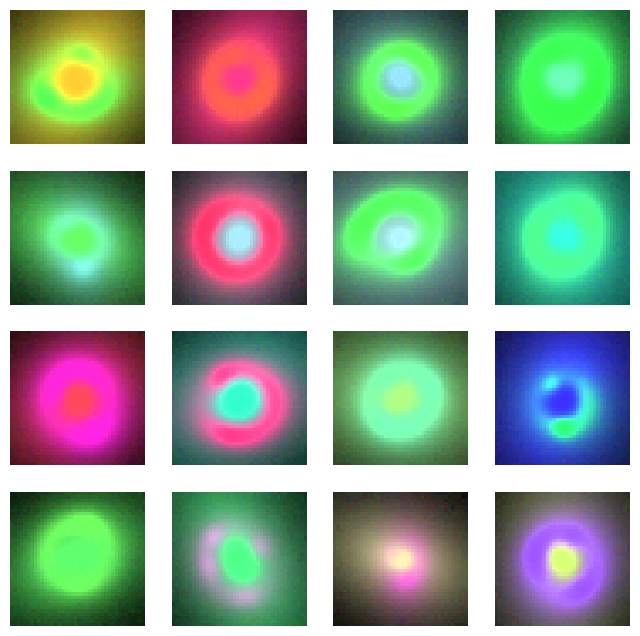

In [3]:
# Visualize source data
visualize_data(source_data)

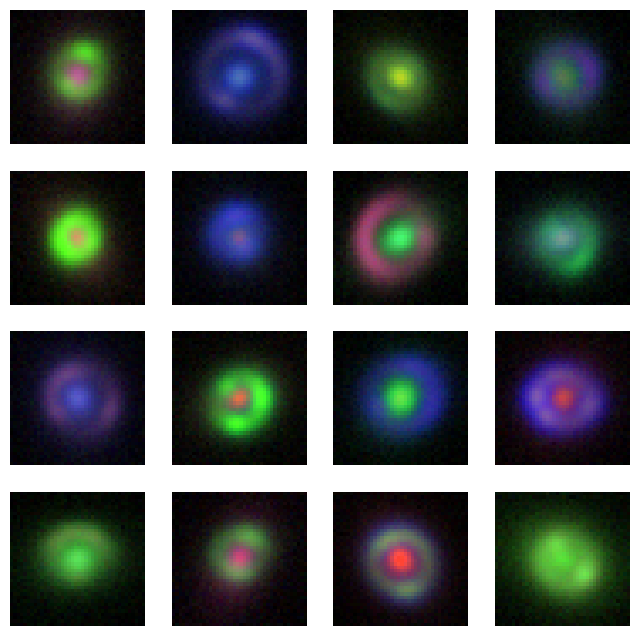

In [4]:
# Visualize target data
visualize_data(target_data)

## Model Setup

In [5]:
# Choose how you prefer to evolve beta and the DA Weight
def da_weight_function(epoch):
    """ Linear evolving DA weighting in loss function. """
    da_weight = init_wt_da - ((init_wt_da - final_wt_da) * (epoch / n_epoch))
    return da_weight

def beta_function(epoch):
    """ Linear evolving beta weighting in loss function until halfway through total epochs. """
    beta_val = beta_init - (beta_init - beta_final) * (2 * epoch / n_epoch)
    if ((epoch / n_epoch) > 0.5):
        beta_val = beta_final
    return beta_val

# Initialize hyperparameters
learning_rate = 1e-5
n_epoch = 150
init_wt_da = 1.4
final_wt_da = 1.0
beta_init = 1.0
beta_final = 0.4

In [6]:
# Initialize model
model = NeuralNetworkMVE(npix=40).cuda()

# Loss Functions / Optimizers
regressor_loss_fn = nn.MSELoss().cuda()
da_loss_fn = MMD_loss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

In [8]:
# To continue training from a past model, enter path into load_mod_name
# Else, enter None, and you still have to run the function.
# Then, enter save_mod_name to save for the current run  

load_mod_name = None # "models/start_code_test_2"
stats, model, optimizer, best_target_R2, best_mve_loss = initialize_state(load_mod_name, model, optimizer)


#save_mod_name = load_mod_name # may overwrite loaded model
save_mod_name = "models/mve_v1_aug4_0222"

## Train

Beginning Training...
Generating Isomap...


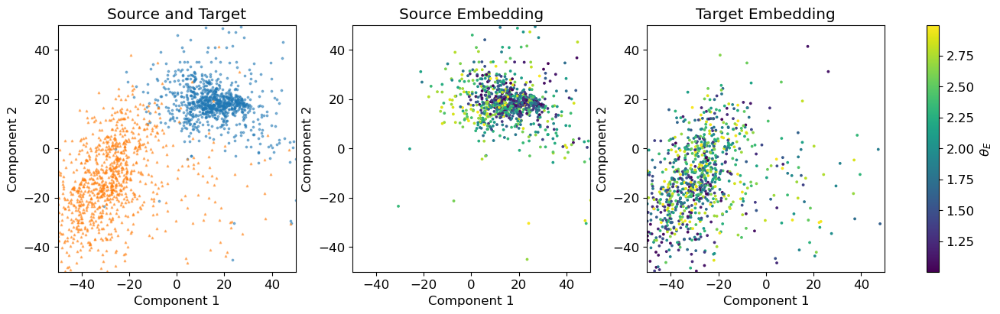


Epoch 0: 12.85s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.4225
	Train Regression Loss: : 2.0228
	Train Mve Loss: : 0.8718
	Train R2 Score: : -5.3896
 Validation Statistics:
	Val Source Regression Loss: : 0.6984
	Val Target Regression Loss: : 0.7127
	Val Source R2 Score: : -1.1907
	Val Target R2 Score: : -1.2593
	Val Source Mve Loss: : 0.2236
	Val Target Mve Loss: : 0.2263
Saving Model MVE... Done.

Epoch 1: 12.19s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2611
	Train Regression Loss: : 0.3959
	Train Mve Loss: : 0.0492
	Train R2 Score: : -0.2346
 Validation Statistics:
	Val Source Regression Loss: : 0.2936
	Val Target Regression Loss: : 0.3125
	Val Source R2 Score: : 0.0809
	Val Target R2 Score: : 0.0252
	Val Source Mve Loss: : -0.0280
	Val Target Mve Loss: : -0.0175
Saving Model... Done.
Saving Model MVE... Done.

Epoch 2: 12.82s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.2042
	Train Regress

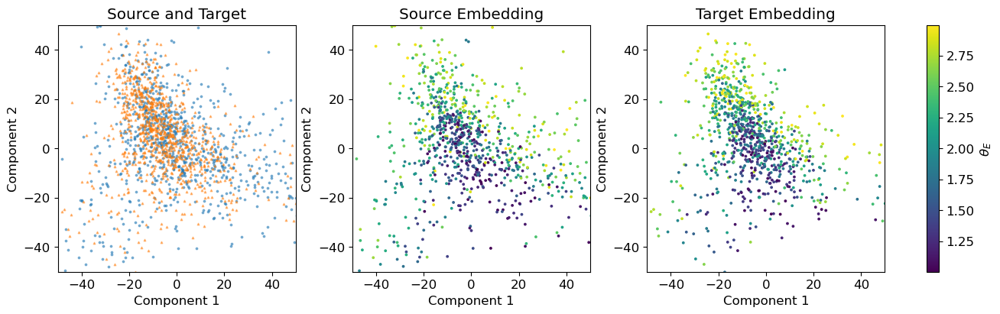

Saving Model... Done.

Epoch 5: 19.07s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1612
	Train Regression Loss: : 0.0565
	Train Mve Loss: : -0.0899
	Train R2 Score: : 0.8232
 Validation Statistics:
	Val Source Regression Loss: : 0.0545
	Val Target Regression Loss: : 0.0572
	Val Source R2 Score: : 0.8309
	Val Target R2 Score: : 0.8200
	Val Source Mve Loss: : -0.0614
	Val Target Mve Loss: : -0.0586
Saving Model... Done.

Epoch 6: 15.50s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1581
	Train Regression Loss: : 0.0463
	Train Mve Loss: : -0.0660
	Train R2 Score: : 0.8549
 Validation Statistics:
	Val Source Regression Loss: : 0.0470
	Val Target Regression Loss: : 0.0501
	Val Source R2 Score: : 0.8512
	Val Target R2 Score: : 0.8416
	Val Source Mve Loss: : -0.0545
	Val Target Mve Loss: : -0.0504
Saving Model... Done.

Epoch 7: 12.69s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1557
	Train Regression Loss

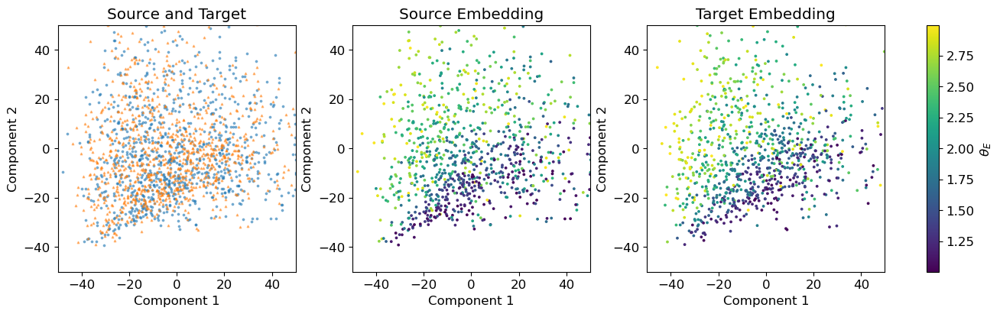

Saving Model... Done.
Saving Model MVE... Done.

Epoch 10: 18.07s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1512
	Train Regression Loss: : 0.0357
	Train Mve Loss: : -0.0659
	Train R2 Score: : 0.8871
 Validation Statistics:
	Val Source Regression Loss: : 0.0370
	Val Target Regression Loss: : 0.0413
	Val Source R2 Score: : 0.8850
	Val Target R2 Score: : 0.8685
	Val Source Mve Loss: : -0.0596
	Val Target Mve Loss: : -0.0548
Saving Model... Done.

Epoch 11: 14.23s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1490
	Train Regression Loss: : 0.0342
	Train Mve Loss: : -0.0983
	Train R2 Score: : 0.8920
 Validation Statistics:
	Val Source Regression Loss: : 0.0365
	Val Target Regression Loss: : 0.0399
	Val Source R2 Score: : 0.8841
	Val Target R2 Score: : 0.8737
	Val Source Mve Loss: : -0.0817
	Val Target Mve Loss: : -0.0786
Saving Model... Done.
Saving Model MVE... Done.

Epoch 12: 15.26s
-------------------------------
 Training Stat

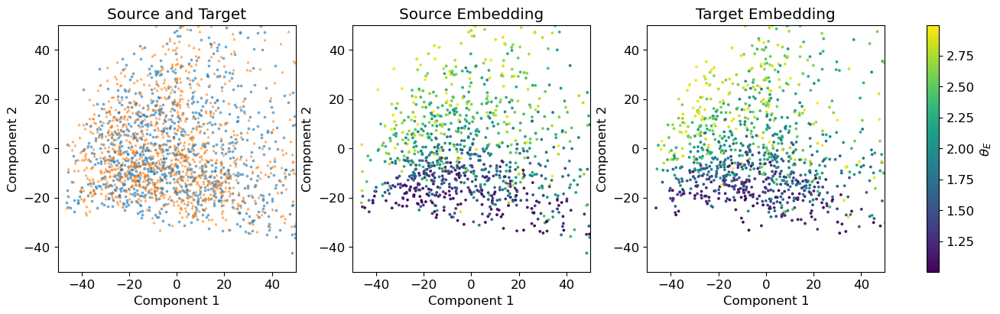

Saving Model... Done.

Epoch 15: 14.36s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1499
	Train Regression Loss: : 0.0325
	Train Mve Loss: : -0.0910
	Train R2 Score: : 0.8974
 Validation Statistics:
	Val Source Regression Loss: : 0.0340
	Val Target Regression Loss: : 0.0364
	Val Source R2 Score: : 0.8916
	Val Target R2 Score: : 0.8839
	Val Source Mve Loss: : -0.0819
	Val Target Mve Loss: : -0.0796
Saving Model... Done.

Epoch 16: 14.47s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1481
	Train Regression Loss: : 0.0318
	Train Mve Loss: : -0.0699
	Train R2 Score: : 0.9000
 Validation Statistics:
	Val Source Regression Loss: : 0.0333
	Val Target Regression Loss: : 0.0356
	Val Source R2 Score: : 0.8963
	Val Target R2 Score: : 0.8870
	Val Source Mve Loss: : -0.0622
	Val Target Mve Loss: : -0.0595
Saving Model... Done.

Epoch 17: 14.02s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1453
	Train Regression L

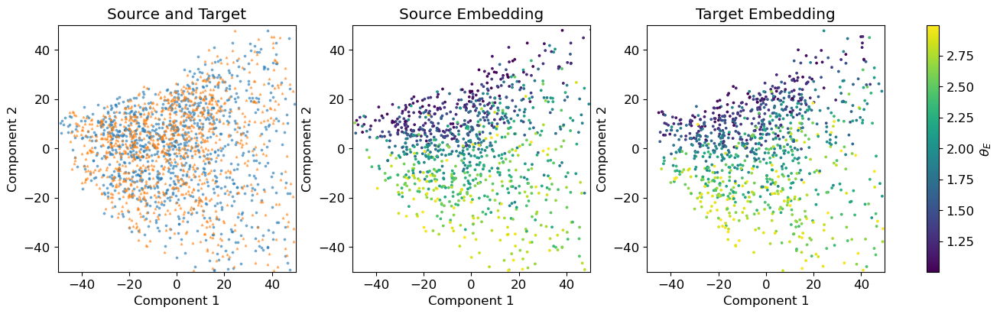


Epoch 20: 14.89s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1437
	Train Regression Loss: : 0.0302
	Train Mve Loss: : -0.0852
	Train R2 Score: : 0.9046
 Validation Statistics:
	Val Source Regression Loss: : 0.0321
	Val Target Regression Loss: : 0.0330
	Val Source R2 Score: : 0.8978
	Val Target R2 Score: : 0.8957
	Val Source Mve Loss: : -0.1012
	Val Target Mve Loss: : -0.0992
Saving Model... Done.

Epoch 21: 14.00s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1435
	Train Regression Loss: : 0.0296
	Train Mve Loss: : -0.0920
	Train R2 Score: : 0.9067
 Validation Statistics:
	Val Source Regression Loss: : 0.0321
	Val Target Regression Loss: : 0.0335
	Val Source R2 Score: : 0.8993
	Val Target R2 Score: : 0.8940
	Val Source Mve Loss: : -0.0637
	Val Target Mve Loss: : -0.0604

Epoch 22: 14.26s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1421
	Train Regression Loss: : 0.0294
	Train Mve Loss: : -0.0863
	Tr

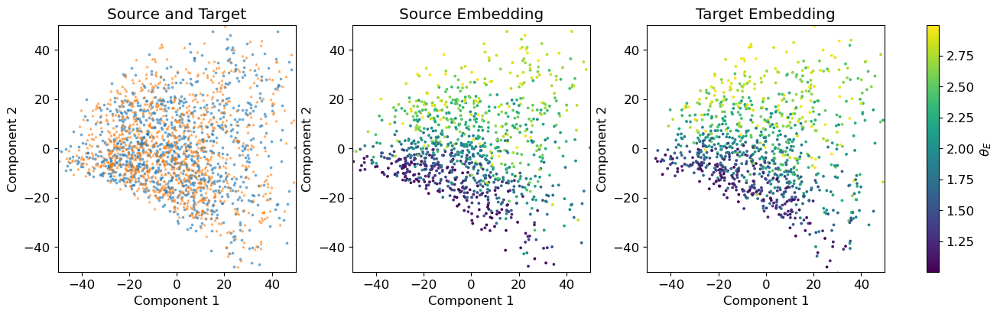


Epoch 25: 14.18s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1397
	Train Regression Loss: : 0.0281
	Train Mve Loss: : -0.1577
	Train R2 Score: : 0.9116
 Validation Statistics:
	Val Source Regression Loss: : 0.0298
	Val Target Regression Loss: : 0.0321
	Val Source R2 Score: : 0.9070
	Val Target R2 Score: : 0.8985
	Val Source Mve Loss: : -0.2090
	Val Target Mve Loss: : -0.2075
Saving Model... Done.
Saving Model MVE... Done.

Epoch 26: 18.81s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1400
	Train Regression Loss: : 0.0277
	Train Mve Loss: : -0.2087
	Train R2 Score: : 0.9123
 Validation Statistics:
	Val Source Regression Loss: : 0.0294
	Val Target Regression Loss: : 0.0309
	Val Source R2 Score: : 0.9064
	Val Target R2 Score: : 0.9009
	Val Source Mve Loss: : -0.1997
	Val Target Mve Loss: : -0.1983
Saving Model... Done.

Epoch 27: 14.32s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1432
	Train Regressi

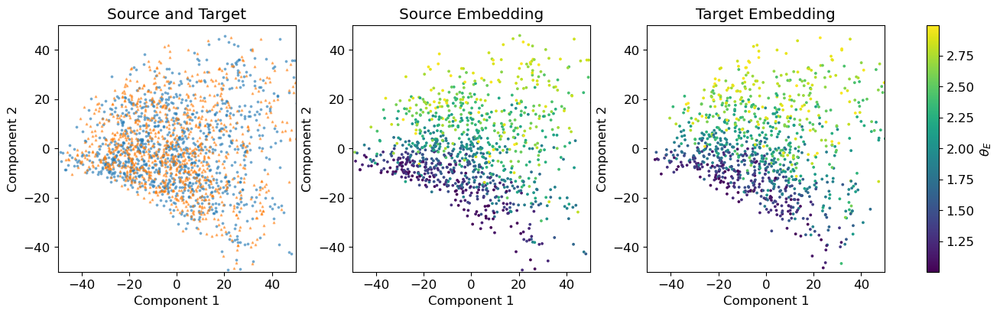

Saving Model... Done.
Saving Model MVE... Done.

Epoch 30: 13.35s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1393
	Train Regression Loss: : 0.0271
	Train Mve Loss: : -0.1860
	Train R2 Score: : 0.9145
 Validation Statistics:
	Val Source Regression Loss: : 0.0282
	Val Target Regression Loss: : 0.0304
	Val Source R2 Score: : 0.9118
	Val Target R2 Score: : 0.9030
	Val Source Mve Loss: : -0.1152
	Val Target Mve Loss: : -0.1114

Epoch 31: 13.98s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1401
	Train Regression Loss: : 0.0269
	Train Mve Loss: : -0.0984
	Train R2 Score: : 0.9155
 Validation Statistics:
	Val Source Regression Loss: : 0.0289
	Val Target Regression Loss: : 0.0293
	Val Source R2 Score: : 0.9087
	Val Target R2 Score: : 0.9062
	Val Source Mve Loss: : -0.0865
	Val Target Mve Loss: : -0.0803
Saving Model... Done.

Epoch 32: 14.00s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1422
	Train Regressi

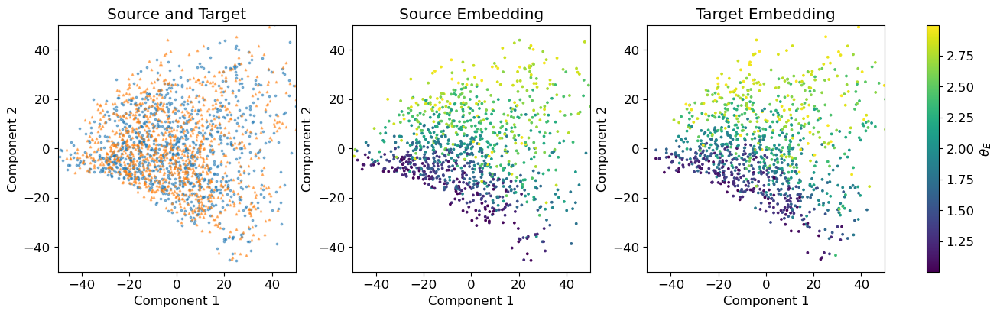


Epoch 35: 13.97s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1389
	Train Regression Loss: : 0.0255
	Train Mve Loss: : -0.1565
	Train R2 Score: : 0.9192
 Validation Statistics:
	Val Source Regression Loss: : 0.0271
	Val Target Regression Loss: : 0.0286
	Val Source R2 Score: : 0.9143
	Val Target R2 Score: : 0.9090
	Val Source Mve Loss: : -0.1298
	Val Target Mve Loss: : -0.1272

Epoch 36: 14.19s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1411
	Train Regression Loss: : 0.0253
	Train Mve Loss: : -0.1141
	Train R2 Score: : 0.9204
 Validation Statistics:
	Val Source Regression Loss: : 0.0269
	Val Target Regression Loss: : 0.0284
	Val Source R2 Score: : 0.9150
	Val Target R2 Score: : 0.9098
	Val Source Mve Loss: : -0.1091
	Val Target Mve Loss: : -0.1072
Saving Model... Done.

Epoch 37: 17.08s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1405
	Train Regression Loss: : 0.0252
	Train Mve Loss: : -0.1165
	Tr

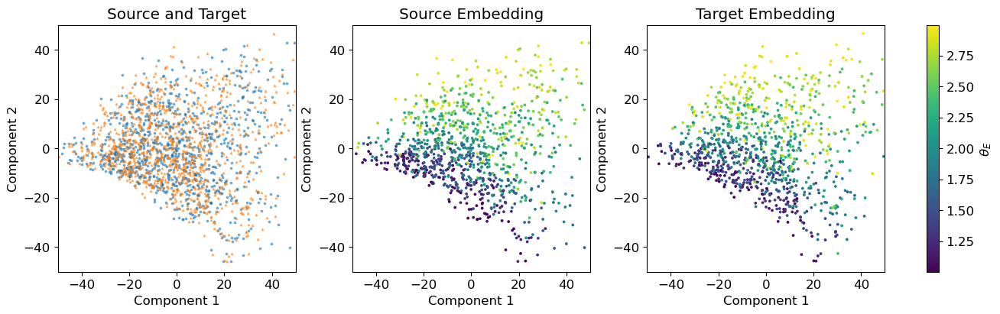

Saving Model... Done.

Epoch 40: 13.59s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1401
	Train Regression Loss: : 0.0242
	Train Mve Loss: : -0.1172
	Train R2 Score: : 0.9237
 Validation Statistics:
	Val Source Regression Loss: : 0.0255
	Val Target Regression Loss: : 0.0268
	Val Source R2 Score: : 0.9196
	Val Target R2 Score: : 0.9137
	Val Source Mve Loss: : -0.1253
	Val Target Mve Loss: : -0.1238

Epoch 41: 12.08s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1380
	Train Regression Loss: : 0.0236
	Train Mve Loss: : -0.1490
	Train R2 Score: : 0.9260
 Validation Statistics:
	Val Source Regression Loss: : 0.0245
	Val Target Regression Loss: : 0.0272
	Val Source R2 Score: : 0.9239
	Val Target R2 Score: : 0.9128
	Val Source Mve Loss: : -0.2239
	Val Target Mve Loss: : -0.2205

Epoch 42: 12.59s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1390
	Train Regression Loss: : 0.0234
	Train Mve Loss: : -0.1511
	Tr

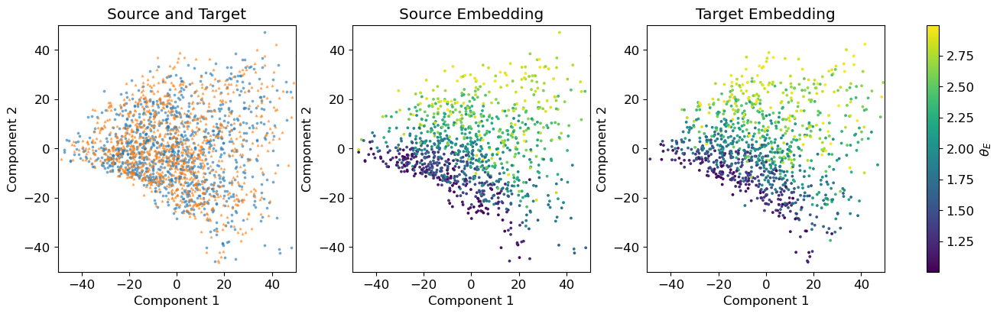


Epoch 45: 16.35s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1397
	Train Regression Loss: : 0.0226
	Train Mve Loss: : -0.1766
	Train R2 Score: : 0.9289
 Validation Statistics:
	Val Source Regression Loss: : 0.0238
	Val Target Regression Loss: : 0.0256
	Val Source R2 Score: : 0.9270
	Val Target R2 Score: : 0.9182
	Val Source Mve Loss: : -0.1255
	Val Target Mve Loss: : -0.1249

Epoch 46: 12.72s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1389
	Train Regression Loss: : 0.0224
	Train Mve Loss: : -0.1645
	Train R2 Score: : 0.9293
 Validation Statistics:
	Val Source Regression Loss: : 0.0234
	Val Target Regression Loss: : 0.0252
	Val Source R2 Score: : 0.9270
	Val Target R2 Score: : 0.9185
	Val Source Mve Loss: : -0.1288
	Val Target Mve Loss: : -0.1212
Saving Model... Done.

Epoch 47: 16.08s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1387
	Train Regression Loss: : 0.0221
	Train Mve Loss: : -0.1448
	Tr

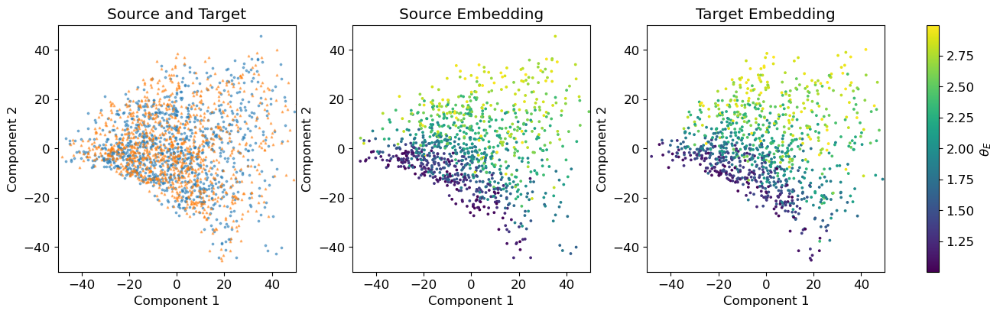

Saving Model... Done.

Epoch 50: 167.14s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1381
	Train Regression Loss: : 0.0213
	Train Mve Loss: : -0.1791
	Train R2 Score: : 0.9333
 Validation Statistics:
	Val Source Regression Loss: : 0.0223
	Val Target Regression Loss: : 0.0240
	Val Source R2 Score: : 0.9302
	Val Target R2 Score: : 0.9247
	Val Source Mve Loss: : -0.1597
	Val Target Mve Loss: : -0.1518
Saving Model... Done.

Epoch 51: 14.84s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1396
	Train Regression Loss: : 0.0211
	Train Mve Loss: : -0.1652
	Train R2 Score: : 0.9336
 Validation Statistics:
	Val Source Regression Loss: : 0.0214
	Val Target Regression Loss: : 0.0244
	Val Source R2 Score: : 0.9325
	Val Target R2 Score: : 0.9226
	Val Source Mve Loss: : -0.2467
	Val Target Mve Loss: : -0.2423
Saving Model MVE... Done.

Epoch 52: 14.28s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1401
	Train Regress

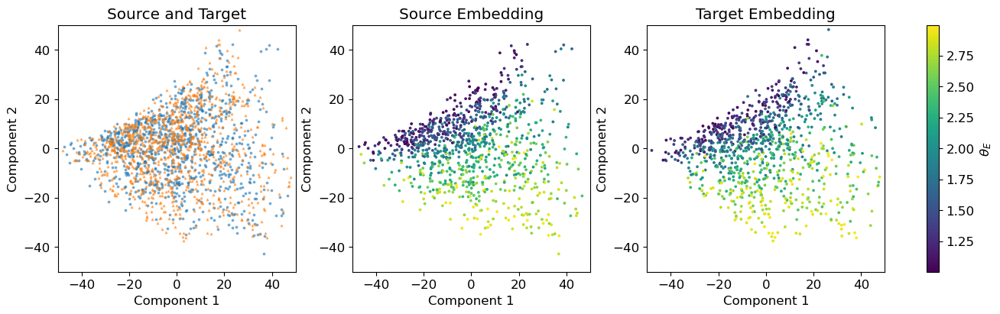

Saving Model... Done.

Epoch 55: 15.15s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1392
	Train Regression Loss: : 0.0202
	Train Mve Loss: : -0.1879
	Train R2 Score: : 0.9367
 Validation Statistics:
	Val Source Regression Loss: : 0.0217
	Val Target Regression Loss: : 0.0242
	Val Source R2 Score: : 0.9315
	Val Target R2 Score: : 0.9236
	Val Source Mve Loss: : -0.2877
	Val Target Mve Loss: : -0.2843

Epoch 56: 14.99s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1386
	Train Regression Loss: : 0.0201
	Train Mve Loss: : -0.2353
	Train R2 Score: : 0.9363
 Validation Statistics:
	Val Source Regression Loss: : 0.0208
	Val Target Regression Loss: : 0.0227
	Val Source R2 Score: : 0.9355
	Val Target R2 Score: : 0.9268
	Val Source Mve Loss: : -0.3003
	Val Target Mve Loss: : -0.2977
Saving Model MVE... Done.

Epoch 57: 16.01s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1383
	Train Regression Loss: : 0.0200
	Tra

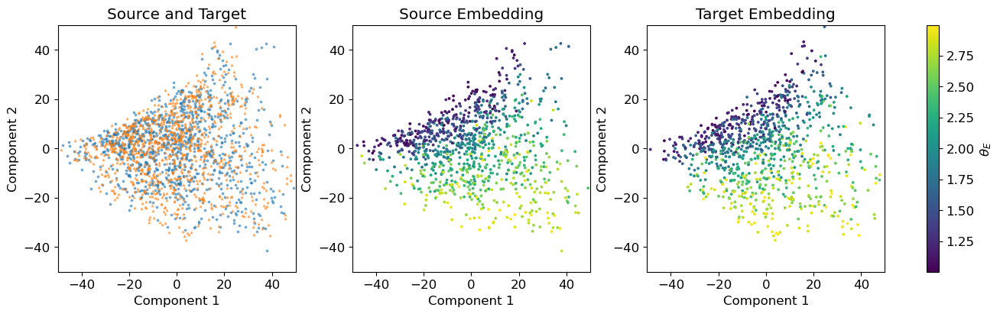


Epoch 60: 14.09s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1389
	Train Regression Loss: : 0.0197
	Train Mve Loss: : -0.2408
	Train R2 Score: : 0.9381
 Validation Statistics:
	Val Source Regression Loss: : 0.0206
	Val Target Regression Loss: : 0.0228
	Val Source R2 Score: : 0.9360
	Val Target R2 Score: : 0.9269
	Val Source Mve Loss: : -0.3248
	Val Target Mve Loss: : -0.3222
Saving Model MVE... Done.

Epoch 61: 17.95s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1401
	Train Regression Loss: : 0.0197
	Train Mve Loss: : -0.2612
	Train R2 Score: : 0.9378
 Validation Statistics:
	Val Source Regression Loss: : 0.0202
	Val Target Regression Loss: : 0.0219
	Val Source R2 Score: : 0.9370
	Val Target R2 Score: : 0.9295
	Val Source Mve Loss: : -0.0833
	Val Target Mve Loss: : -0.0481
Saving Model... Done.

Epoch 62: 14.66s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1400
	Train Regression Loss: : 0.0196
	Tra

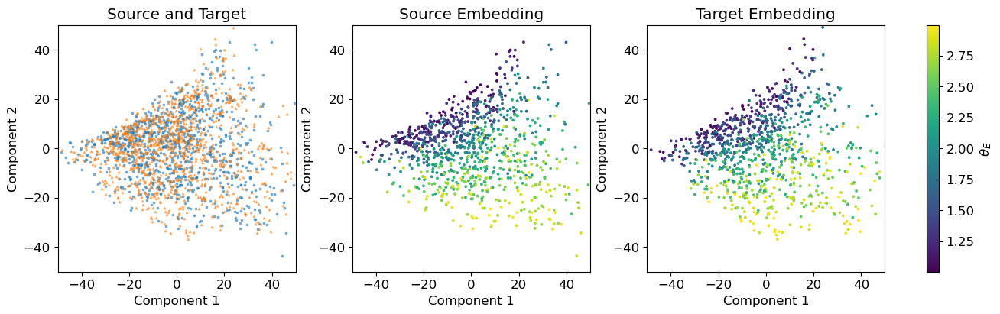


Epoch 65: 16.38s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1408
	Train Regression Loss: : 0.0194
	Train Mve Loss: : -0.2182
	Train R2 Score: : 0.9392
 Validation Statistics:
	Val Source Regression Loss: : 0.0201
	Val Target Regression Loss: : 0.0225
	Val Source R2 Score: : 0.9375
	Val Target R2 Score: : 0.9273
	Val Source Mve Loss: : -0.1159
	Val Target Mve Loss: : -0.0990

Epoch 66: 14.92s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1408
	Train Regression Loss: : 0.0193
	Train Mve Loss: : -0.3026
	Train R2 Score: : 0.9390
 Validation Statistics:
	Val Source Regression Loss: : 0.0201
	Val Target Regression Loss: : 0.0226
	Val Source R2 Score: : 0.9368
	Val Target R2 Score: : 0.9268
	Val Source Mve Loss: : -0.3415
	Val Target Mve Loss: : -0.3387

Epoch 67: 14.90s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1411
	Train Regression Loss: : 0.0191
	Train Mve Loss: : -0.3536
	Train R2 Score: : 0.9398

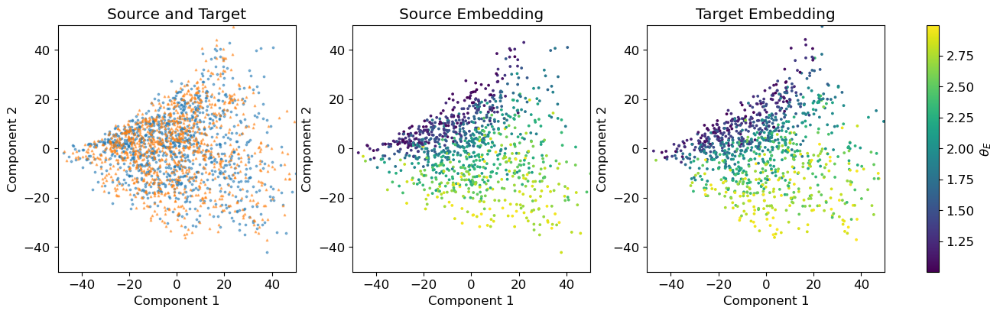

Saving Model MVE... Done.

Epoch 70: 14.61s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1393
	Train Regression Loss: : 0.0191
	Train Mve Loss: : -0.3776
	Train R2 Score: : 0.9401
 Validation Statistics:
	Val Source Regression Loss: : 0.0206
	Val Target Regression Loss: : 0.0221
	Val Source R2 Score: : 0.9356
	Val Target R2 Score: : 0.9292
	Val Source Mve Loss: : -0.3800
	Val Target Mve Loss: : -0.3773
Saving Model MVE... Done.

Epoch 71: 15.91s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1396
	Train Regression Loss: : 0.0196
	Train Mve Loss: : -0.3218
	Train R2 Score: : 0.9379
 Validation Statistics:
	Val Source Regression Loss: : 0.0204
	Val Target Regression Loss: : 0.0220
	Val Source R2 Score: : 0.9355
	Val Target R2 Score: : 0.9293
	Val Source Mve Loss: : -0.3451
	Val Target Mve Loss: : -0.3409

Epoch 72: 15.71s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1401
	Train Regression Loss: : 0.0195


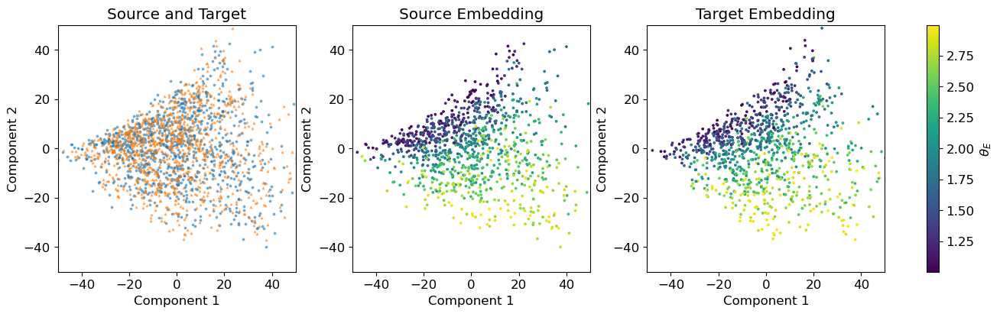

Saving Model MVE... Done.

Epoch 75: 14.51s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1399
	Train Regression Loss: : 0.0207
	Train Mve Loss: : -0.2584
	Train R2 Score: : 0.9351
 Validation Statistics:
	Val Source Regression Loss: : 0.0226
	Val Target Regression Loss: : 0.0252
	Val Source R2 Score: : 0.9288
	Val Target R2 Score: : 0.9159
	Val Source Mve Loss: : -0.3769
	Val Target Mve Loss: : -0.3738

Epoch 76: 12.48s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1397
	Train Regression Loss: : 0.0216
	Train Mve Loss: : -0.3774
	Train R2 Score: : 0.9318
 Validation Statistics:
	Val Source Regression Loss: : 0.0215
	Val Target Regression Loss: : 0.0237
	Val Source R2 Score: : 0.9132
	Val Target R2 Score: : 0.9251
	Val Source Mve Loss: : -0.3776
	Val Target Mve Loss: : -0.3750

Epoch 77: 12.64s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1412
	Train Regression Loss: : 0.0203
	Train Mve Loss: : -0.3792

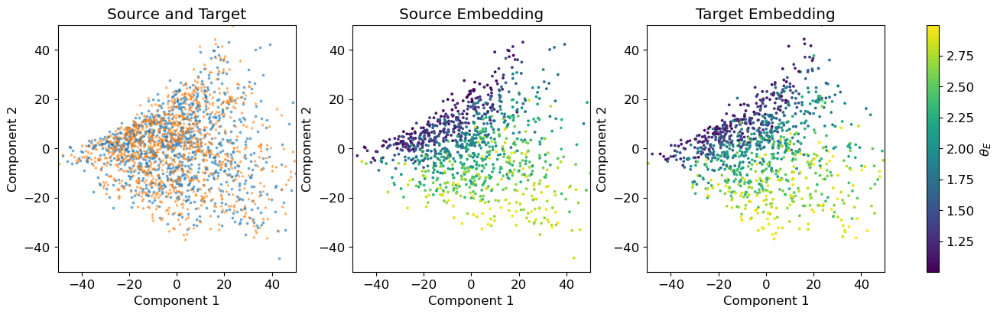


Epoch 80: 13.81s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1392
	Train Regression Loss: : 0.0188
	Train Mve Loss: : -0.3825
	Train R2 Score: : 0.9409
 Validation Statistics:
	Val Source Regression Loss: : 0.0194
	Val Target Regression Loss: : 0.0223
	Val Source R2 Score: : 0.9396
	Val Target R2 Score: : 0.9298
	Val Source Mve Loss: : -0.3823
	Val Target Mve Loss: : -0.3787

Epoch 81: 12.36s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1389
	Train Regression Loss: : 0.0188
	Train Mve Loss: : -0.3840
	Train R2 Score: : 0.9408
 Validation Statistics:
	Val Source Regression Loss: : 0.0199
	Val Target Regression Loss: : 0.0225
	Val Source R2 Score: : 0.9376
	Val Target R2 Score: : 0.9286
	Val Source Mve Loss: : -0.3836
	Val Target Mve Loss: : -0.3802

Epoch 82: 11.51s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1390
	Train Regression Loss: : 0.0188
	Train Mve Loss: : -0.3863
	Train R2 Score: : 0.9406

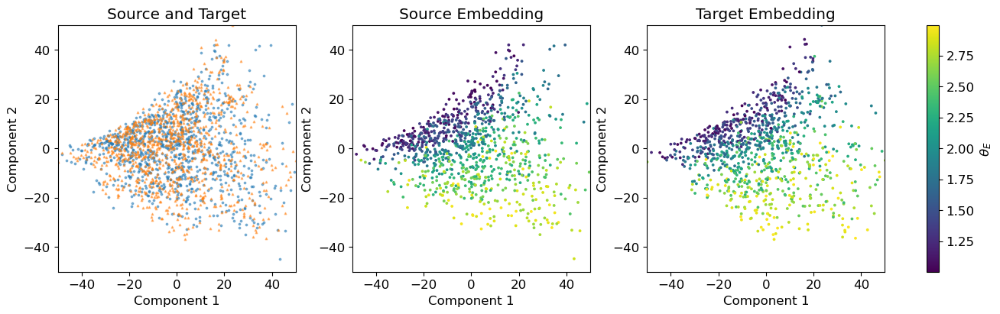


Epoch 85: 12.54s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1398
	Train Regression Loss: : 0.0201
	Train Mve Loss: : -0.4064
	Train R2 Score: : 0.9367
 Validation Statistics:
	Val Source Regression Loss: : 0.0223
	Val Target Regression Loss: : 0.0242
	Val Source R2 Score: : 0.9297
	Val Target R2 Score: : 0.9224
	Val Source Mve Loss: : -0.4078
	Val Target Mve Loss: : -0.4041

Epoch 86: 12.30s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1391
	Train Regression Loss: : 0.0211
	Train Mve Loss: : -0.3706
	Train R2 Score: : 0.9339
 Validation Statistics:
	Val Source Regression Loss: : 0.0238
	Val Target Regression Loss: : 0.0249
	Val Source R2 Score: : 0.9270
	Val Target R2 Score: : 0.9208
	Val Source Mve Loss: : 0.1855
	Val Target Mve Loss: : -0.3493

Epoch 87: 11.77s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1411
	Train Regression Loss: : 0.0210
	Train Mve Loss: : -0.3977
	Train R2 Score: : 0.9338


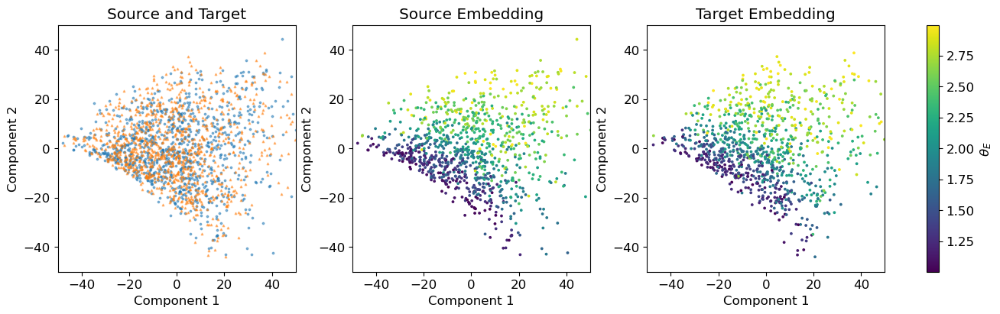


Epoch 90: 11.48s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1405
	Train Regression Loss: : 0.0207
	Train Mve Loss: : -0.4083
	Train R2 Score: : 0.9348
 Validation Statistics:
	Val Source Regression Loss: : 0.0214
	Val Target Regression Loss: : 0.0232
	Val Source R2 Score: : 0.9335
	Val Target R2 Score: : 0.9250
	Val Source Mve Loss: : -0.3579
	Val Target Mve Loss: : -0.3455

Epoch 91: 11.91s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1406
	Train Regression Loss: : 0.0203
	Train Mve Loss: : -0.3474
	Train R2 Score: : 0.9363
 Validation Statistics:
	Val Source Regression Loss: : 0.0214
	Val Target Regression Loss: : 0.0226
	Val Source R2 Score: : 0.9326
	Val Target R2 Score: : 0.9273
	Val Source Mve Loss: : -0.4125
	Val Target Mve Loss: : -0.4104
Saving Model MVE... Done.

Epoch 92: 11.83s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1413
	Train Regression Loss: : 0.0201
	Train Mve Loss: : -0.3520

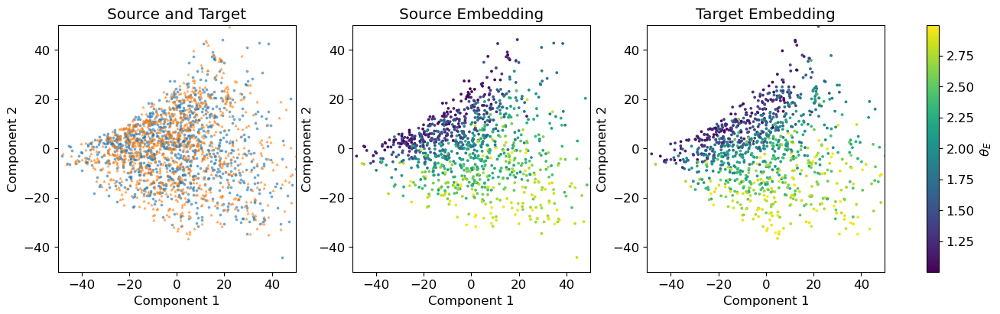


Epoch 95: 14.33s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1389
	Train Regression Loss: : 0.0211
	Train Mve Loss: : -0.2295
	Train R2 Score: : 0.9336
 Validation Statistics:
	Val Source Regression Loss: : 0.0204
	Val Target Regression Loss: : 0.0232
	Val Source R2 Score: : 0.9356
	Val Target R2 Score: : 0.9262
	Val Source Mve Loss: : -0.3953
	Val Target Mve Loss: : -0.3913

Epoch 96: 12.71s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1400
	Train Regression Loss: : 0.0206
	Train Mve Loss: : -0.3543
	Train R2 Score: : 0.9351
 Validation Statistics:
	Val Source Regression Loss: : 0.0272
	Val Target Regression Loss: : 0.0302
	Val Source R2 Score: : 0.9139
	Val Target R2 Score: : 0.9049
	Val Source Mve Loss: : -0.3679
	Val Target Mve Loss: : -0.3639

Epoch 97: 13.96s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1417
	Train Regression Loss: : 0.0207
	Train Mve Loss: : -0.3922
	Train R2 Score: : 0.9345

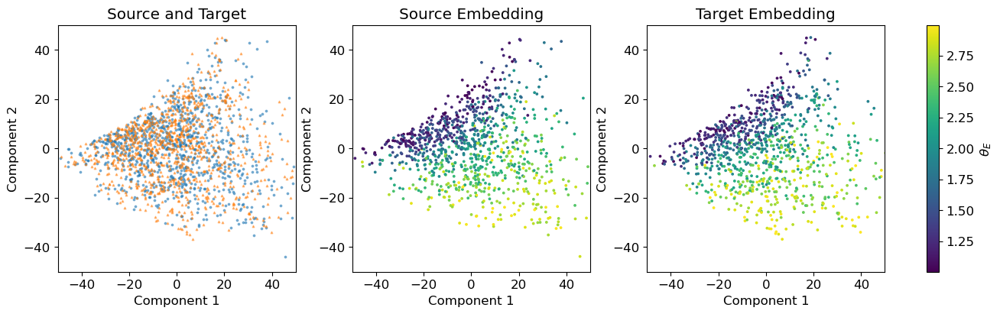


Epoch 100: 12.82s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1405
	Train Regression Loss: : 0.0197
	Train Mve Loss: : -0.3219
	Train R2 Score: : 0.9381
 Validation Statistics:
	Val Source Regression Loss: : 0.0200
	Val Target Regression Loss: : 0.0218
	Val Source R2 Score: : 0.9375
	Val Target R2 Score: : 0.9291
	Val Source Mve Loss: : -0.4167
	Val Target Mve Loss: : -0.4131
Saving Model MVE... Done.

Epoch 101: 13.60s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1399
	Train Regression Loss: : 0.0196
	Train Mve Loss: : -0.2139
	Train R2 Score: : 0.9383
 Validation Statistics:
	Val Source Regression Loss: : 0.0216
	Val Target Regression Loss: : 0.0235
	Val Source R2 Score: : 0.9333
	Val Target R2 Score: : 0.9260
	Val Source Mve Loss: : -0.4121
	Val Target Mve Loss: : -0.4088

Epoch 102: 16.88s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1429
	Train Regression Loss: : 0.0208
	Train Mve Loss: : -0.3

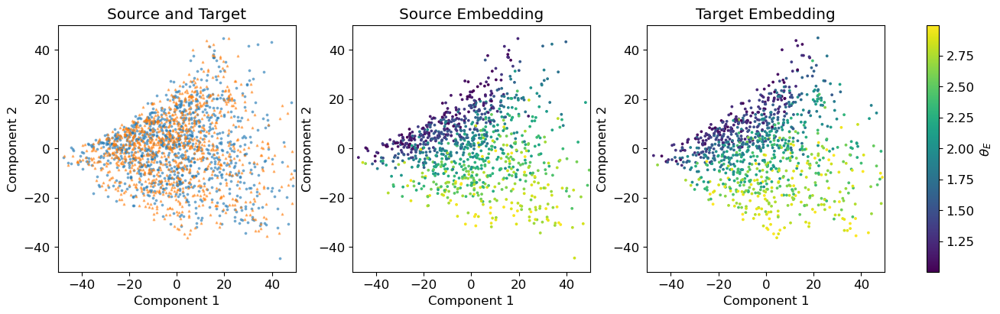


Epoch 105: 16.46s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1388
	Train Regression Loss: : 0.0201
	Train Mve Loss: : -0.3733
	Train R2 Score: : 0.9370
 Validation Statistics:
	Val Source Regression Loss: : 0.0207
	Val Target Regression Loss: : 0.0234
	Val Source R2 Score: : 0.9353
	Val Target R2 Score: : 0.9244
	Val Source Mve Loss: : -0.3726
	Val Target Mve Loss: : -0.3692

Epoch 106: 14.64s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1392
	Train Regression Loss: : 0.0199
	Train Mve Loss: : -0.3735
	Train R2 Score: : 0.9374
 Validation Statistics:
	Val Source Regression Loss: : 0.0211
	Val Target Regression Loss: : 0.0239
	Val Source R2 Score: : 0.9347
	Val Target R2 Score: : 0.9239
	Val Source Mve Loss: : -0.3722
	Val Target Mve Loss: : -0.3686

Epoch 107: 14.51s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1412
	Train Regression Loss: : 0.0197
	Train Mve Loss: : -0.3739
	Train R2 Score: : 0.9

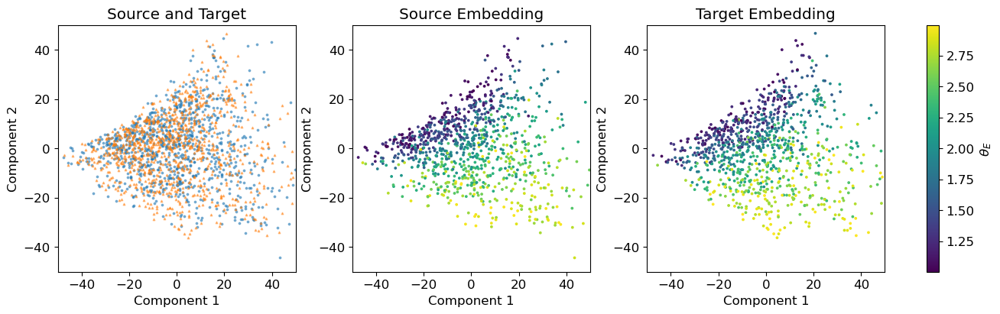


Epoch 110: 15.50s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1400
	Train Regression Loss: : 0.0186
	Train Mve Loss: : -0.3762
	Train R2 Score: : 0.9417
 Validation Statistics:
	Val Source Regression Loss: : 0.0196
	Val Target Regression Loss: : 0.0219
	Val Source R2 Score: : 0.9387
	Val Target R2 Score: : 0.9294
	Val Source Mve Loss: : -0.3755
	Val Target Mve Loss: : -0.3725

Epoch 111: 15.56s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1397
	Train Regression Loss: : 0.0182
	Train Mve Loss: : -0.3778
	Train R2 Score: : 0.9427
 Validation Statistics:
	Val Source Regression Loss: : 0.0188
	Val Target Regression Loss: : 0.0212
	Val Source R2 Score: : 0.9397
	Val Target R2 Score: : 0.9321
	Val Source Mve Loss: : -0.3781
	Val Target Mve Loss: : -0.3749

Epoch 112: 14.70s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1384
	Train Regression Loss: : 0.0180
	Train Mve Loss: : -0.3801
	Train R2 Score: : 0.9

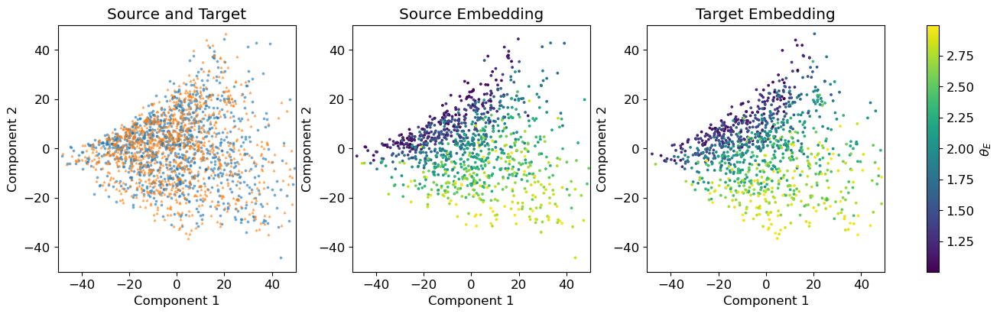


Epoch 115: 12.96s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1411
	Train Regression Loss: : 0.0178
	Train Mve Loss: : -0.4005
	Train R2 Score: : 0.9439
 Validation Statistics:
	Val Source Regression Loss: : 0.0188
	Val Target Regression Loss: : 0.0208
	Val Source R2 Score: : 0.9383
	Val Target R2 Score: : 0.9338
	Val Source Mve Loss: : -0.4058
	Val Target Mve Loss: : -0.4027
Saving Model... Done.

Epoch 116: 13.14s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1418
	Train Regression Loss: : 0.0176
	Train Mve Loss: : -0.4146
	Train R2 Score: : 0.9447
 Validation Statistics:
	Val Source Regression Loss: : 0.0190
	Val Target Regression Loss: : 0.0205
	Val Source R2 Score: : 0.9400
	Val Target R2 Score: : 0.9356
	Val Source Mve Loss: : -0.4148
	Val Target Mve Loss: : -0.4119
Saving Model... Done.

Epoch 117: 12.35s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1402
	Train Regression Loss: : 0.0182
	Trai

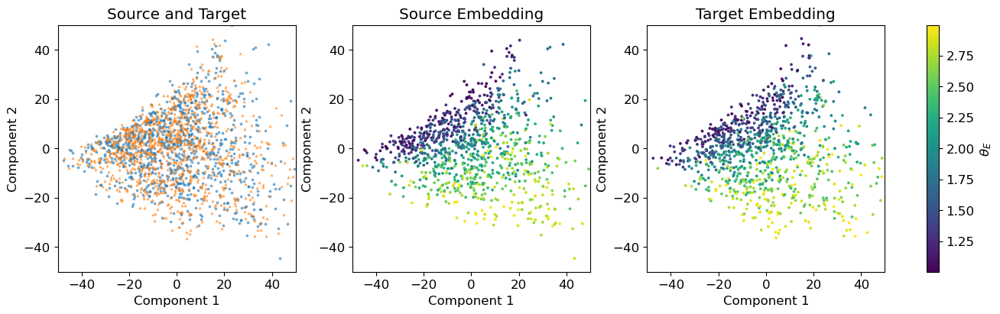


Epoch 120: 14.75s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1396
	Train Regression Loss: : 0.0180
	Train Mve Loss: : -0.0855
	Train R2 Score: : 0.9428
 Validation Statistics:
	Val Source Regression Loss: : 0.0192
	Val Target Regression Loss: : 0.0208
	Val Source R2 Score: : 0.9401
	Val Target R2 Score: : 0.9333
	Val Source Mve Loss: : 0.6145
	Val Target Mve Loss: : 0.8756

Epoch 121: 14.31s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1403
	Train Regression Loss: : 0.0188
	Train Mve Loss: : 0.1697
	Train R2 Score: : 0.9402
 Validation Statistics:
	Val Source Regression Loss: : 0.0189
	Val Target Regression Loss: : 0.0219
	Val Source R2 Score: : 0.9417
	Val Target R2 Score: : 0.9284
	Val Source Mve Loss: : -0.1031
	Val Target Mve Loss: : -0.1191

Epoch 122: 15.97s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1398
	Train Regression Loss: : 0.0188
	Train Mve Loss: : -0.2641
	Train R2 Score: : 0.9414

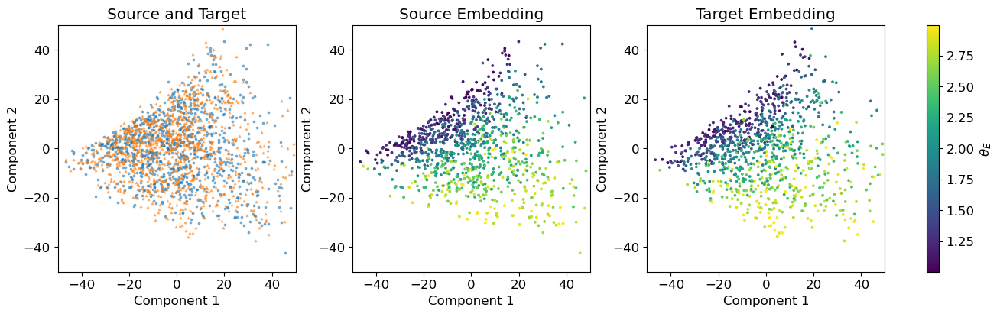


Epoch 125: 15.86s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1418
	Train Regression Loss: : 0.0186
	Train Mve Loss: : -0.3998
	Train R2 Score: : 0.9415
 Validation Statistics:
	Val Source Regression Loss: : 0.0192
	Val Target Regression Loss: : 0.0211
	Val Source R2 Score: : 0.9409
	Val Target R2 Score: : 0.9326
	Val Source Mve Loss: : -0.4128
	Val Target Mve Loss: : -0.4097

Epoch 126: 15.14s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1417
	Train Regression Loss: : 0.0189
	Train Mve Loss: : -0.4069
	Train R2 Score: : 0.9402
 Validation Statistics:
	Val Source Regression Loss: : 0.0201
	Val Target Regression Loss: : 0.0224
	Val Source R2 Score: : 0.9367
	Val Target R2 Score: : 0.9279
	Val Source Mve Loss: : -0.3972
	Val Target Mve Loss: : -0.4122

Epoch 127: 15.97s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1419
	Train Regression Loss: : 0.0195
	Train Mve Loss: : -0.2896
	Train R2 Score: : 0.9

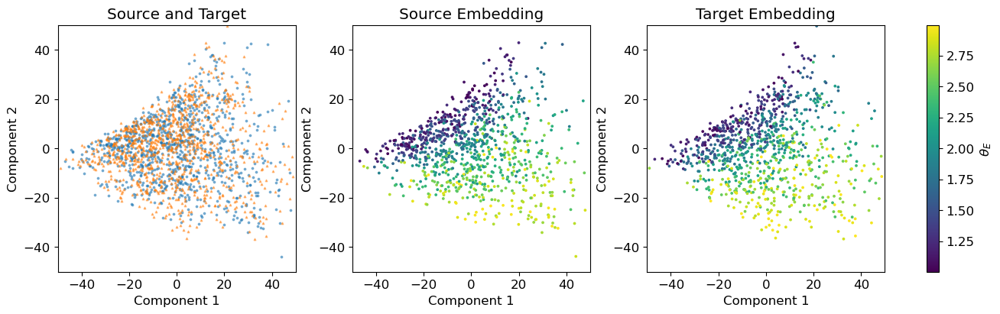


Epoch 130: 14.73s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1408
	Train Regression Loss: : 0.0186
	Train Mve Loss: : -0.3808
	Train R2 Score: : 0.9413
 Validation Statistics:
	Val Source Regression Loss: : 0.0202
	Val Target Regression Loss: : 0.0221
	Val Source R2 Score: : 0.9348
	Val Target R2 Score: : 0.9297
	Val Source Mve Loss: : -0.3812
	Val Target Mve Loss: : -0.3787

Epoch 131: 14.52s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1409
	Train Regression Loss: : 0.0183
	Train Mve Loss: : -0.3867
	Train R2 Score: : 0.9428
 Validation Statistics:
	Val Source Regression Loss: : 0.0193
	Val Target Regression Loss: : 0.0217
	Val Source R2 Score: : 0.9402
	Val Target R2 Score: : 0.9294
	Val Source Mve Loss: : -0.3894
	Val Target Mve Loss: : -0.3860

Epoch 132: 14.91s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1407
	Train Regression Loss: : 0.0181
	Train Mve Loss: : -0.3963
	Train R2 Score: : 0.9

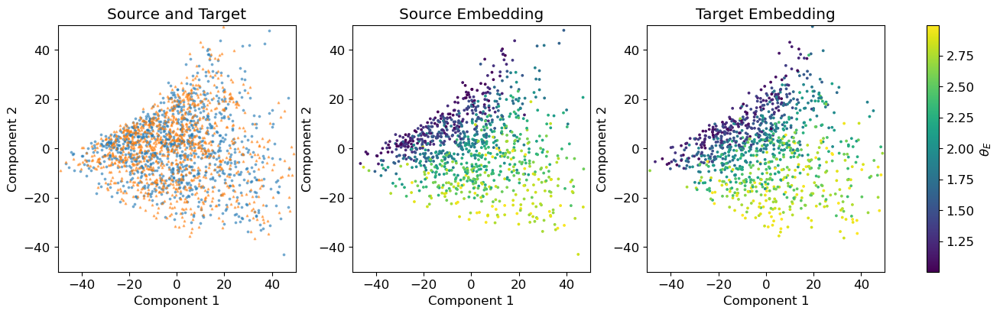


Epoch 135: 15.44s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1396
	Train Regression Loss: : 0.0198
	Train Mve Loss: : -0.3480
	Train R2 Score: : 0.9381
 Validation Statistics:
	Val Source Regression Loss: : 0.0200
	Val Target Regression Loss: : 0.0213
	Val Source R2 Score: : 0.9379
	Val Target R2 Score: : 0.9321
	Val Source Mve Loss: : -0.4031
	Val Target Mve Loss: : -0.4003

Epoch 136: 14.81s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1413
	Train Regression Loss: : 0.0201
	Train Mve Loss: : -0.2982
	Train R2 Score: : 0.9369
 Validation Statistics:
	Val Source Regression Loss: : 0.0208
	Val Target Regression Loss: : 0.0243
	Val Source R2 Score: : 0.9346
	Val Target R2 Score: : 0.9226
	Val Source Mve Loss: : -0.3880
	Val Target Mve Loss: : -0.3832

Epoch 137: 15.29s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1378
	Train Regression Loss: : 0.0186
	Train Mve Loss: : -0.4077
	Train R2 Score: : 0.9

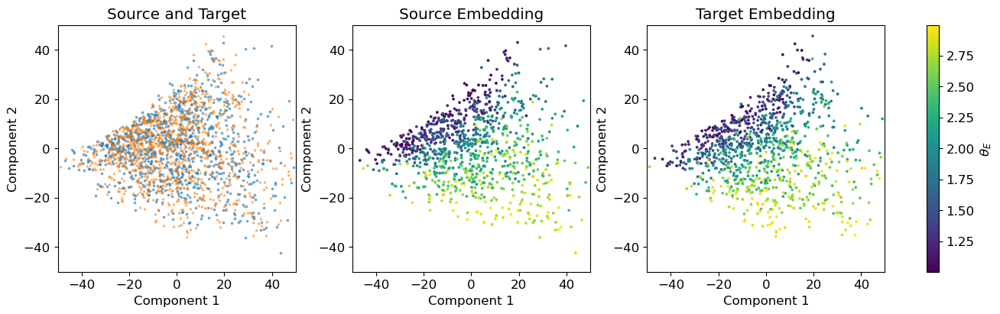


Epoch 140: 14.88s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1400
	Train Regression Loss: : 0.0188
	Train Mve Loss: : -0.3746
	Train R2 Score: : 0.9410
 Validation Statistics:
	Val Source Regression Loss: : 0.0196
	Val Target Regression Loss: : 0.0223
	Val Source R2 Score: : 0.9395
	Val Target R2 Score: : 0.9288
	Val Source Mve Loss: : -0.3764
	Val Target Mve Loss: : -0.3724

Epoch 141: 14.59s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1399
	Train Regression Loss: : 0.0185
	Train Mve Loss: : -0.3809
	Train R2 Score: : 0.9417
 Validation Statistics:
	Val Source Regression Loss: : 0.0194
	Val Target Regression Loss: : 0.0220
	Val Source R2 Score: : 0.9396
	Val Target R2 Score: : 0.9311
	Val Source Mve Loss: : -0.3842
	Val Target Mve Loss: : -0.3803

Epoch 142: 14.53s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1402
	Train Regression Loss: : 0.0183
	Train Mve Loss: : -0.3913
	Train R2 Score: : 0.9

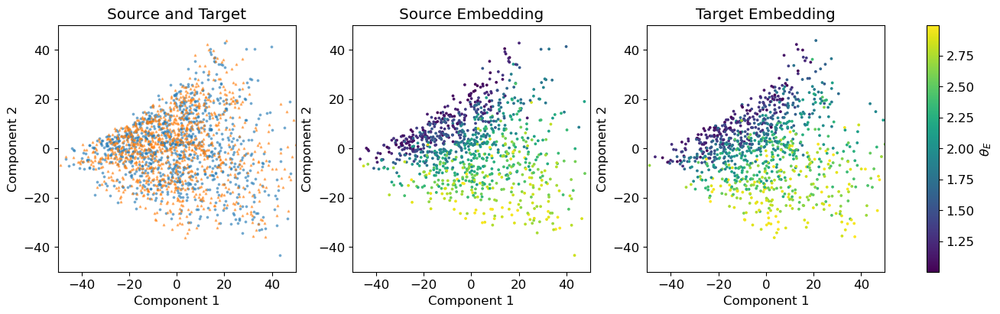


Epoch 145: 12.55s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1401
	Train Regression Loss: : 0.0197
	Train Mve Loss: : -0.3415
	Train R2 Score: : 0.9386
 Validation Statistics:
	Val Source Regression Loss: : 0.0209
	Val Target Regression Loss: : 0.0241
	Val Source R2 Score: : 0.9358
	Val Target R2 Score: : 0.9221
	Val Source Mve Loss: : -0.3739
	Val Target Mve Loss: : -0.3696

Epoch 146: 13.09s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1411
	Train Regression Loss: : 0.0194
	Train Mve Loss: : -0.3773
	Train R2 Score: : 0.9391
 Validation Statistics:
	Val Source Regression Loss: : 0.0206
	Val Target Regression Loss: : 0.0237
	Val Source R2 Score: : 0.9357
	Val Target R2 Score: : 0.9244
	Val Source Mve Loss: : -0.3781
	Val Target Mve Loss: : -0.3738

Epoch 147: 13.19s
-------------------------------
 Training Statistics:
	Train Da Loss: : 0.1409
	Train Regression Loss: : 0.0191
	Train Mve Loss: : -0.3826
	Train R2 Score: : 0.9

In [9]:
print("Beginning Training...")


for curr_epoch in range(stats['epoch_no'], stats['epoch_no'] + n_epoch):

        # Generate isomaps every 5 epochs
        if (curr_epoch % 5 == 0):
            print("Generating Isomap...")
            source_iso, target_iso = generate_isomaps(source_data, target_data, model)
            show_isomaps(source_iso, 
                         target_iso, 
                         isomap_source_label_sample, 
                         isomap_target_label_sample, 
                         save_mod_name, 
                         name = stats["epoch_no"], 
                         axlim = 50, save = True)

        # Save best models
        if (len(stats['val_target_r2_score']) > 0):
            
            # Save and overwrite model every best target R2
            if (stats['val_target_r2_score'][-1] > best_target_R2):
                print("Saving Model...", end = ' ')
                save_model(save_mod_name, model, optimizer, stats)
                best_target_R2 = stats['val_target_r2_score'][-1]
                print("Done.")
                
            # Save and overwrite model every best target MVE Loss
            if (stats['val_target_mve_loss'][-1] < best_mve_loss):
                print("Saving Model MVE...", end = ' ')
                mve_name = save_mod_name + "_mve"
                save_model(mve_name, model, optimizer, stats)
                best_mve_loss = stats['val_target_mve_loss'][-1]
                print("Done.")

        
        start_time = time.time()

        beta = beta_function(curr_epoch)
        da_weight = da_weight_function(curr_epoch)

        # Train, backpropagate
        vals = train_loop_mve(source_train_dataloader, 
                              target_train_dataloader, 
                              model,
                              regressor_loss_fn, 
                              da_loss_fn, 
                              optimizer,
                              da_weight, 
                              beta)

        # Test, validate metrics
        vals_validate = test_loop_mve(source_val_dataloader, 
                                      target_val_dataloader,
                                      model, 
                                      regressor_loss_fn, 
                                      beta)

        # Training Metrics
        stats['train_DA_loss'].append(vals[0])
        stats['train_regression_loss'].append(vals[1])
        stats['train_mve_loss'].append(vals[2])
        stats['train_r2_score'].append(vals[3])

        # Validation Metrics
        stats['val_source_regression_loss'].append(vals_validate[0])
        stats['val_target_regression_loss'].append(vals_validate[1])
        stats['val_source_r2_score'].append(vals_validate[2])
        stats['val_target_r2_score'].append(vals_validate[3])
        stats['val_source_mve_loss'].append(vals_validate[4])
        stats['val_target_mve_loss'].append(vals_validate[5])
        
        # Other Parameters
        stats['da_weight'].append(da_weight)
        stats['beta'].append(beta)
        stats['epoch_no'] += 1

        print_epoch_scores(stats, curr_epoch, time.time() - start_time)

In [10]:
# Saves the end result model after running for all stages, as well as the .json of stats

state = {
    'epoch': stats['epoch_no'],
    'state_dict': model.state_dict(),
    'optimizer': optimizer.state_dict(),
}
final_mod_name = save_mod_name + "_final"
torch.save(state, final_mod_name)
json.dump(stats, open(final_mod_name+'.json', 'w'))

## Visualize Results

In [11]:
# Loads a model for plotting/viz

viz_mod_name = final_mod_name # "models/start_code_test_4_final"
model.load_state_dict(torch.load(viz_mod_name)['state_dict'])
stats = json.load(open(viz_mod_name+'.json', 'r'))

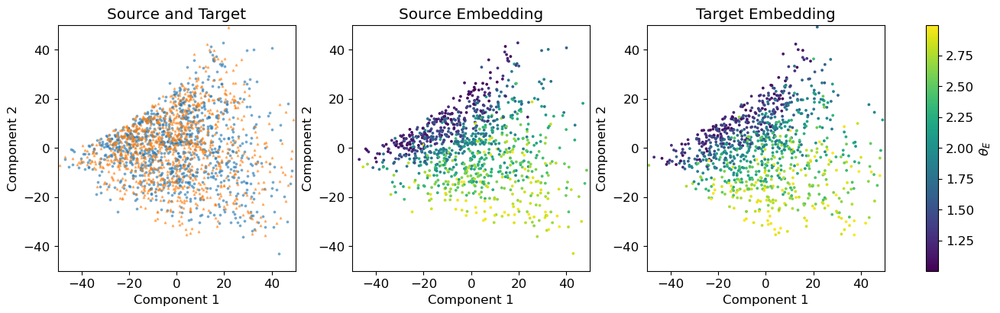

(<Figure size 1300x400 with 4 Axes>,
 array([<Axes: title={'center': 'Source and Target'}, xlabel='Component 1', ylabel='Component 2'>,
        <Axes: title={'center': 'Source Embedding'}, xlabel='Component 1', ylabel='Component 2'>,
        <Axes: title={'center': 'Target Embedding'}, xlabel='Component 1', ylabel='Component 2'>],
       dtype=object))

In [12]:
# Visualize isomaps 
trained_source_iso, trained_target_iso = generate_isomaps(source_data, target_data, model)
show_isomaps(trained_source_iso, trained_target_iso, isomap_source_label_sample, isomap_target_label_sample, viz_mod_name, axlim = 50)

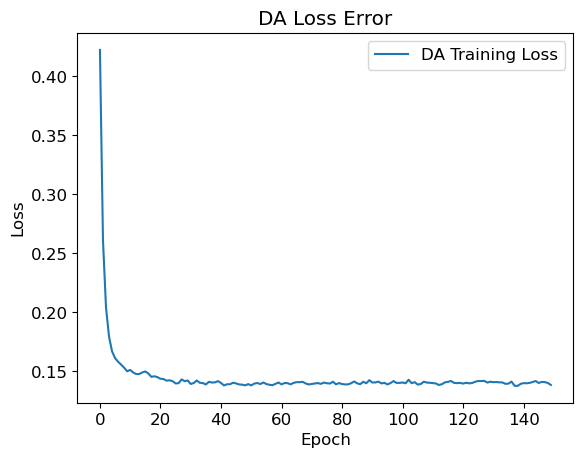

In [13]:
# DA Loss
fmt = lambda k: " ".join([i.capitalize() for i in k.split('_')])
eps = np.arange(stats["epoch_no"])
plt.title("DA Loss Error")
plt.plot(eps, stats['train_DA_loss'], label = "DA Training Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

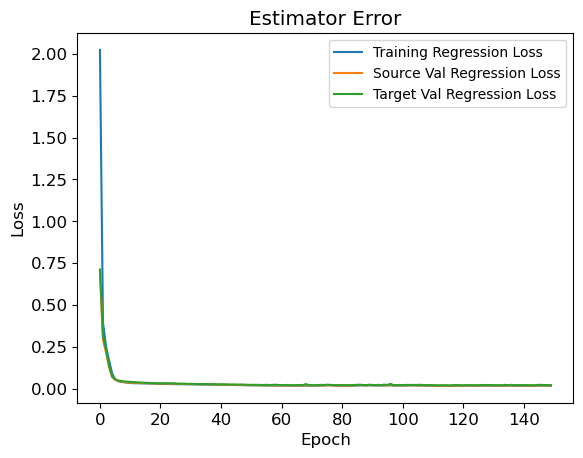

In [14]:
# Estimator / Regression
plt.title("Estimator Error")
plt.plot(eps, stats['train_regression_loss'], label = "Training Regression Loss")
plt.plot(eps, stats['val_source_regression_loss'], label = "Source Val Regression Loss")
plt.plot(eps, stats['val_target_regression_loss'], label = "Target Val Regression Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend(fontsize = 'small')

(-1.0, 1.0)

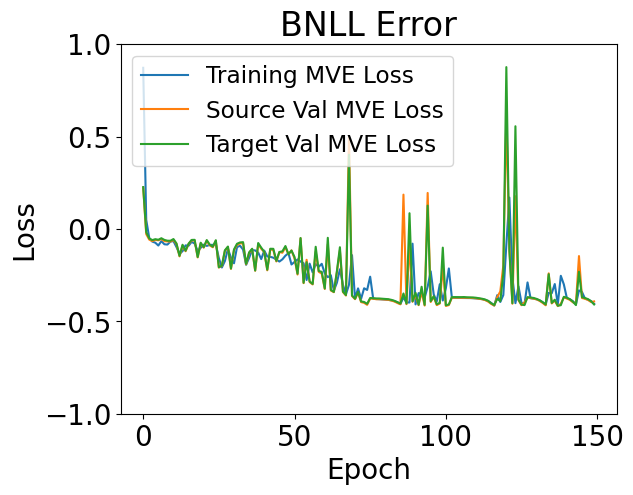

In [27]:
# BNLL for MVE
plt.title("BNLL Error")
plt.plot(eps, stats['train_mve_loss'], label = "Training MVE Loss")
plt.plot(eps, stats['val_source_mve_loss'], label = "Source Val MVE Loss")
plt.plot(eps, stats['val_target_mve_loss'], label = "Target Val MVE Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend(fontsize = 'small')
plt.ylim(-1, 1)

(0.5, 1.0)

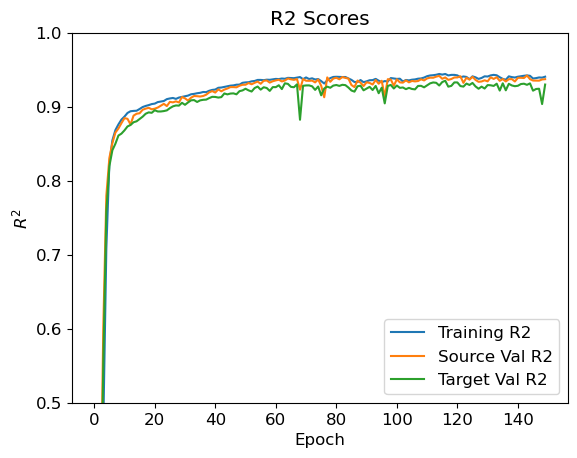

In [16]:
# R2 Scores
plt.title("R2 Scores")
plt.plot(eps, stats['train_r2_score'], label = "Training R2")
plt.plot(eps, stats['val_source_r2_score'], label = "Source Val R2")
plt.plot(eps, stats['val_target_r2_score'], label = "Target Val R2")
plt.xlabel("Epoch")
plt.ylabel("$R^2$")
plt.legend()
plt.ylim(0.5, 1)

In [17]:
# Test Source
var_preds_source = np.array([])
preds_source = np.array([])
true_source = np.array([])
lbnll_source = np.array([])
score_list = np.array([])

with torch.no_grad():
    for X, y in source_test_dataloader:
        X = X.float()
        pred, _ = model(X.cuda())
        preds_source = np.append(preds_source, pred[:, 0].cpu())
        var_preds_source = np.append(var_preds_source, pred[:, 1].cpu())
        true_source = np.append(true_source, y.cpu())
        score = r2_score(y.cpu(), pred[:, 0].cpu())
        score_list = np.append(score_list, score)
        lbnll_source = np.append(lbnll_source, loss_bnll(pred[:, 0].cpu(), pred[:, 1].cpu(), y, beta = 0.5))

score = np.mean(score_list)
print(f'Source R2 Score is {score:.4f}')

Source R2 Score is 0.9391


Text(0.5, 1.0, 'MMD | Source | R2: 0.939')

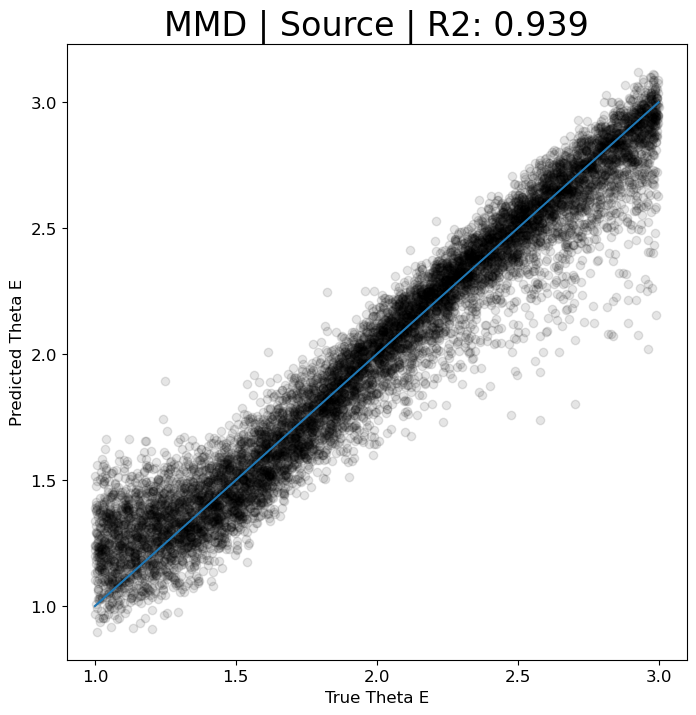

In [18]:
plt.figure(figsize=(8,8))
plt.scatter(true_source, preds_source,  color='black', alpha = 0.1)
line = np.linspace(1, 3, 100)
plt.plot(line, line)
plt.rc('font', size=12)
plt.xlabel('True Theta E')
plt.ylabel('Predicted Theta E');
plt.rc('font', size=20)
plt.title('MMD | Source | R2: {0:.3f}'.format(np.mean(score_list)))

Text(0.5, 1.0, 'Uncertainty | Source | BNLL: -0.342')

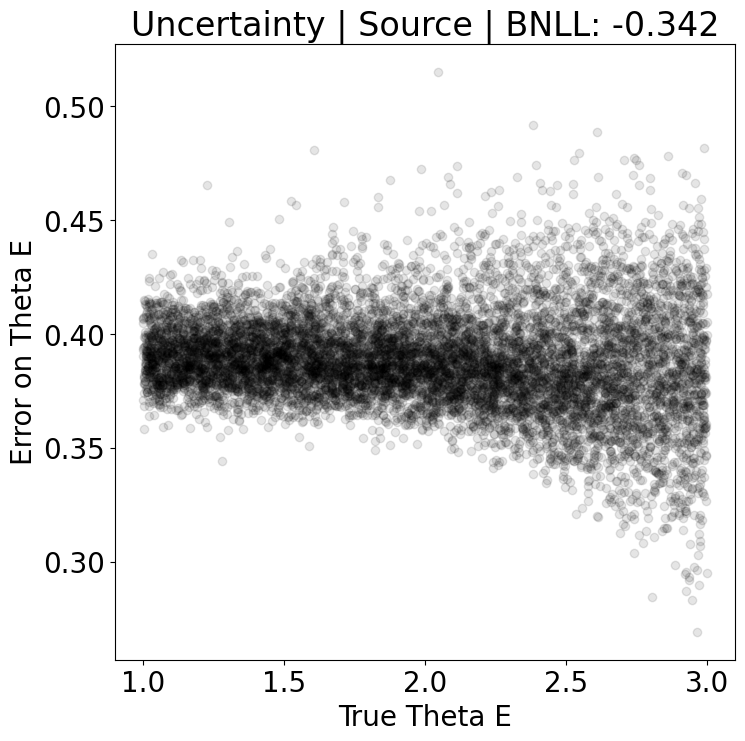

In [19]:
plt.figure(figsize=(8,8))
plt.scatter(true_source, np.sqrt(var_preds_source),  color='black', alpha = 0.1)
plt.rc('font', size=12)
plt.xlabel('True Theta E')
plt.ylabel('Error on Theta E');
plt.rc('font', size=20)
plt.title('Uncertainty | Source | BNLL: {0:.3f}'.format(np.mean(lbnll_source)))

In [20]:
# Test target
preds_target = np.array([])
var_preds_target = np.array([])
true_target = np.array([])
score_list = np.array([])
lbnll_target = np.array([])


with torch.no_grad():
    for X, y in target_test_dataloader:
        X = X.float()
        pred, _ = model(X.cuda())
        preds_target = np.append(preds_target, pred[:, 0].cpu())
        var_preds_target = np.append(var_preds_target, pred[:, 1].cpu())
        true_target = np.append(true_target, y.cpu())
        score = r2_score(y.cpu(), pred[:, 0].cpu())
        score_list = np.append(score_list, score)
        lbnll_target = np.append(lbnll_target, loss_bnll(pred[:, 0].cpu(), pred[:, 1].cpu(), y, beta = 0.5))


score = np.mean(score_list)
print(f'Target R2 Score is {score:.4f}')

Target R2 Score is 0.9276


Text(0.5, 1.0, 'MMD | Target | R2: 0.928')

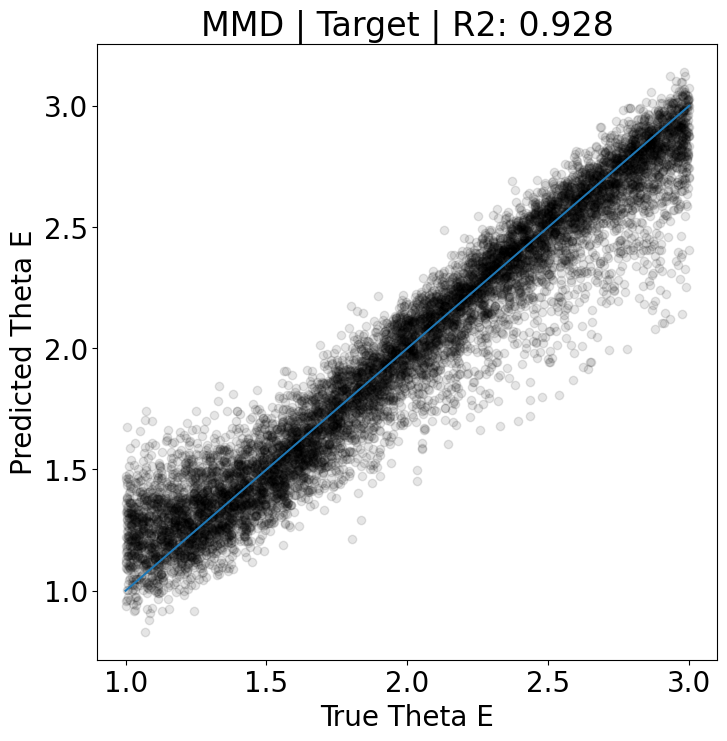

In [21]:
plt.figure(figsize=(8,8))
plt.scatter(true_target, preds_target,  color='black', alpha = 0.1)
line = np.linspace(1, 3, 100)
plt.plot(line, line)
plt.rc('font', size=12)
plt.xlabel('True Theta E')
plt.ylabel('Predicted Theta E');
plt.rc('font', size=20)
plt.title('MMD | Target | R2: {0:.3f}'.format(np.mean(score_list)))

Text(0.5, 1.0, 'MMD | Target | R2: 0.928')

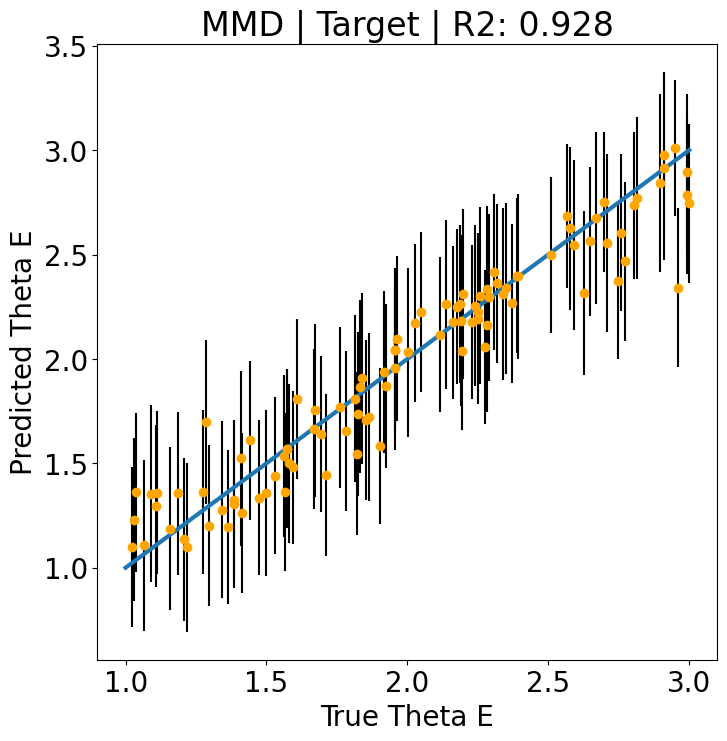

In [22]:
plt.figure(figsize=(8,8))
idx = np.random.choice(np.arange(len(true_target)), 100)
plt.errorbar(true_target[idx], preds_target[idx], yerr = np.sqrt(var_preds_target[idx]), fmt = 'o', color='orange', ecolor = 'k', alpha = 1)
line = np.linspace(1, 3, 100)
plt.plot(line, line, lw = 3)
plt.rc('font', size=12)
plt.xlabel('True Theta E')
plt.ylabel('Predicted Theta E');
plt.rc('font', size=20)
plt.title('MMD | Target | R2: {0:.3f}'.format(np.mean(score_list)))

Text(0.5, 1.0, 'Uncertainty | Target | BNLL: -0.337')

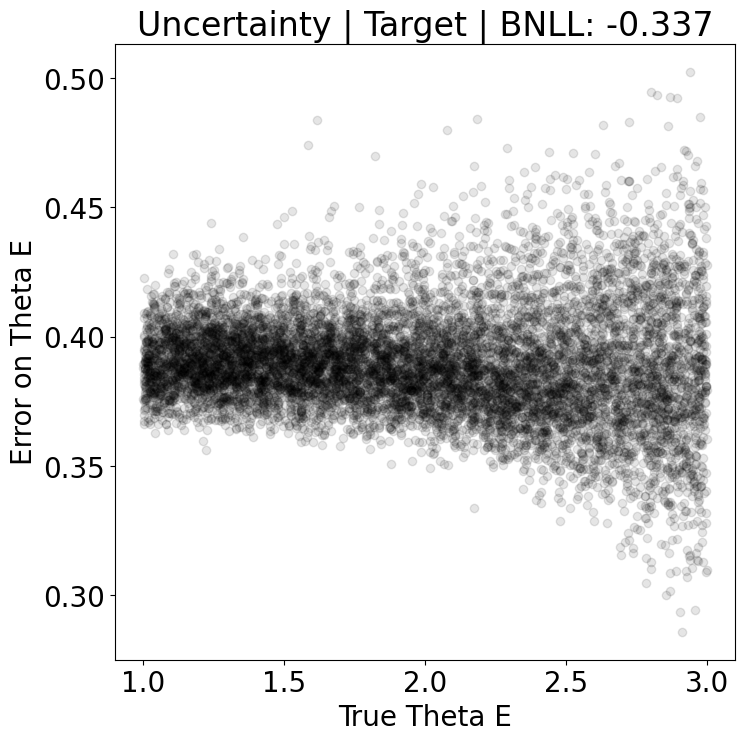

In [23]:
plt.figure(figsize=(8,8))
plt.scatter(true_target, np.sqrt(var_preds_target),  color='black', alpha = 0.1)
plt.rc('font', size=12)
plt.xlabel('True Theta E')
plt.ylabel('Error on Theta E');
plt.rc('font', size=20)
plt.title('Uncertainty | Target | BNLL: {0:.3f}'.format(np.mean(lbnll_target)))

In [24]:
def sample_variance(obs, true):
    return np.std(obs - true) ** 2

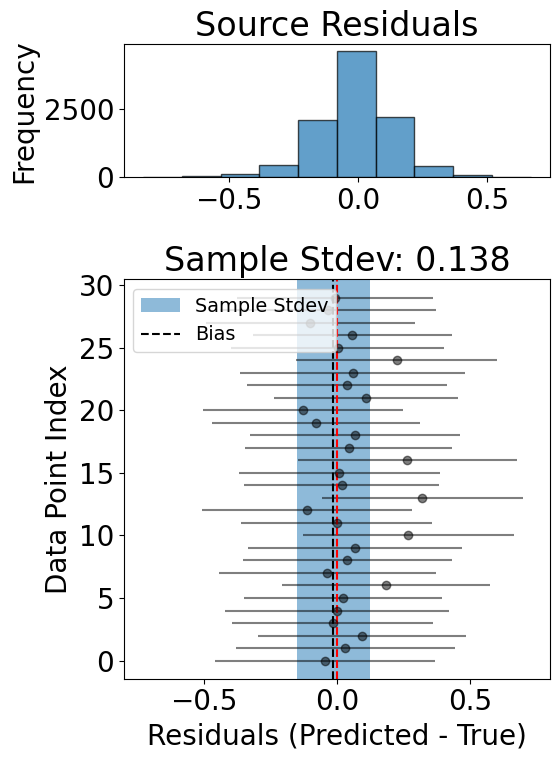

In [25]:
n_points = 30
rand_idx = np.random.choice(np.arange(len(preds_source)), n_points)
residuals = preds_source[rand_idx] - true_source[rand_idx]
resid_all = preds_target - true_target
errors = np.sqrt(var_preds_source[rand_idx])
sv = np.sqrt(sample_variance(preds_source, true_source))
mn = np.mean(resid_all)

# Create the figure and axes
fig, (ax_hist, ax_resid) = plt.subplots(2, 1, gridspec_kw={'height_ratios': [1, 3]}, figsize=(6, 8))



# Plot the histogram
ax_hist.hist(resid_all, bins=10, edgecolor='black', alpha=0.7)
ax_hist.set_title('Source Residuals')
ax_hist.set_ylabel('Frequency')

# Plot the residuals with error bars in the x-direction
ax_resid.errorbar(x=residuals, y=np.arange(n_points), xerr=errors, fmt='o', alpha=0.5, ecolor = 'k', color = 'k')
ax_resid.axvline(x=0, color='red', linestyle='--')
ax_resid.set_xlabel('Residuals (Predicted - True)')
ax_resid.set_ylabel('Data Point Index')
ax_resid.set_title('Sample Stdev: {0:.3f}'.format(sv))
ax_resid.axvspan(mn-sv, mn+sv, alpha = 0.5, label = "Sample Stdev")
ax_resid.axvline(mn, color = 'k', ls = '--', label = "Bias")
ax_resid.legend(loc = 'upper left', fontsize = 'x-small')

plt.xlim(-0.8, 0.8)

plt.tight_layout()
plt.show()

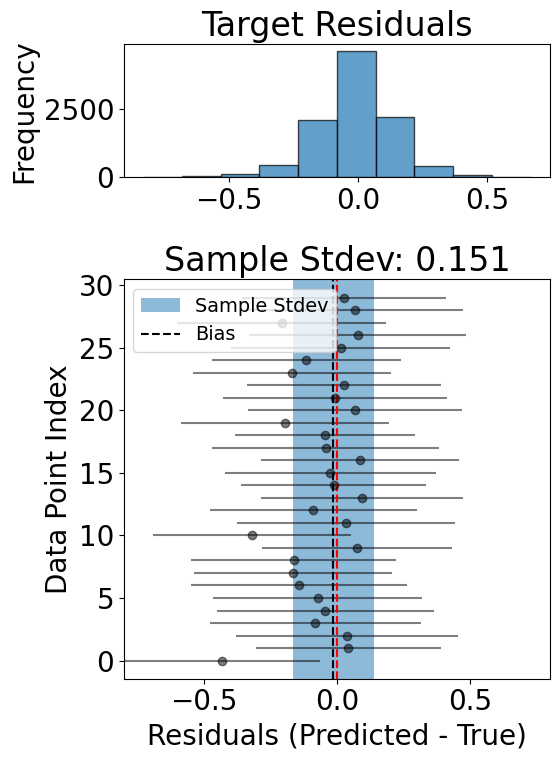

In [26]:
n_points = 30
rand_idx = np.random.choice(np.arange(len(preds_source)), n_points)
residuals = preds_target[rand_idx] - true_target[rand_idx]
resid_all = preds_target - true_target
errors = np.sqrt(var_preds_target[rand_idx])
sv = np.sqrt(sample_variance(preds_target, true_target))
mn = np.mean(resid_all)
# Create the figure and axes
fig, (ax_hist, ax_resid) = plt.subplots(2, 1, gridspec_kw={'height_ratios': [1, 3]}, figsize=(6, 8))



# Plot the histogram
ax_hist.hist(resid_all, bins=10, edgecolor='black', alpha=0.7)
ax_hist.set_title('Target Residuals')
ax_hist.set_ylabel('Frequency')

# Plot the residuals with error bars in the x-direction
ax_resid.errorbar(x=residuals, y=np.arange(n_points), xerr=errors, fmt='o', alpha=0.5, ecolor = 'k', color = 'k')
ax_resid.axvline(x=0, color='red', linestyle='--')
ax_resid.set_xlabel('Residuals (Predicted - True)')
ax_resid.set_ylabel('Data Point Index')
ax_resid.set_title('Sample Stdev: {0:.3f}'.format(sv))
ax_resid.axvspan(mn-sv, mn+sv, alpha = 0.5, label = "Sample Stdev")
ax_resid.axvline(mn, color = 'k', ls = '--', label = "Bias")
ax_resid.legend(loc = 'upper left', fontsize = 'x-small')

plt.xlim(-0.8, 0.8)

plt.tight_layout()
plt.show()